In [15]:
import importlib
import sys
from pathlib import Path
import os
from rich.pretty import pprint
import json
from datetime import datetime, timedelta
from zoneinfo import ZoneInfo
import re
from functools import partial

from hydra import compose, initialize
import dotenv
import hydra
import pytorch_lightning as pl
import torch
from matplotlib import pyplot as plt
from tqdm import tqdm
import numpy as np
from inz.data.data_module import XBDDataModule
from inz.data.event import Event, Hold, Tier1, Tier3, Test
from inz.util import show_masks_comparison
from PIL import Image
from torchvision.utils import draw_segmentation_masks, make_grid  # type: ignore[import-untyped]
from torchvision.io import read_image  # type: ignore[import-untyped]

from pytorch_grad_cam import (
    GradCAM,
    HiResCAM,
    ScoreCAM,
    GradCAMPlusPlus,
    AblationCAM,
    XGradCAM,
    EigenCAM,
    FullGrad,
    EigenGradCAM,
    LayerCAM,
    DeepFeatureFactorization,
    GradCAMElementWise,
)
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from pytorch_grad_cam.utils.image import show_cam_on_image
import wandb

sys.path.append("inz/farseg")
sys.path.append("inz/dahitra")

In [16]:
dotenv.load_dotenv()
RANDOM_SEED = 123
pl.seed_everything(RANDOM_SEED)
device = torch.device("cuda")
torch.set_float32_matmul_precision("high")

assert (WANDB_API_KEY := os.getenv("WANDB_API_KEY")), "No API key specified"
wandb.login(key=WANDB_API_KEY, verify=True)
api = wandb.Api()

Seed set to 123
wandb: WARNING If you're specifying your api key in code, ensure this code is not shared publicly.
wandb: WARNING Consider setting the WANDB_API_KEY environment variable, or running `wandb login` from the command line.
wandb: Appending key for api.wandb.ai to your netrc file: /home/tomek/.netrc


In [17]:
from typing import Literal


RUN_NAME, RUN_ID = "split_wind_test_joplin_tornado_farseg", "vebpzj24"
# RUN_NAME, RUN_ID = "split_wind_test_joplin_tornado_baseline", "bncb1vpz"
# RUN_NAME, RUN_ID = "split_wind_test_joplin_tornado_farseg", "vebpzj24"
# RUN_NAME, RUN_ID = "split_wind_test_joplin_tornado_dahitra", "eja5o5lj"

DM = "xBD"
# DM = "FloodNet"
# DM = "RescueNet"

IMG_NAME = "joplin-tornado_00000000_post_disaster_patch0"

FARSEG_GRADCAM_TARGET: Literal["foreground", "background"] = "foreground"

INFO:simplecv.util.logger:ResNetEncoder: pretrained = True


scene_relation: on
loss type: cosine

Run name: split_wind_test_joplin_tornado_farseg
Run id: vebpzj24
Model: DoubleBranchFarSegModule
Checkpoint path: outputs/split_wind_test_joplin_tornado_farseg/latest_run/checkpoints/experiment_name-0-epoch-27-step-4564-challenge_score_safe-0.6874-best-challenge-score.ckpt

Pre-disaster


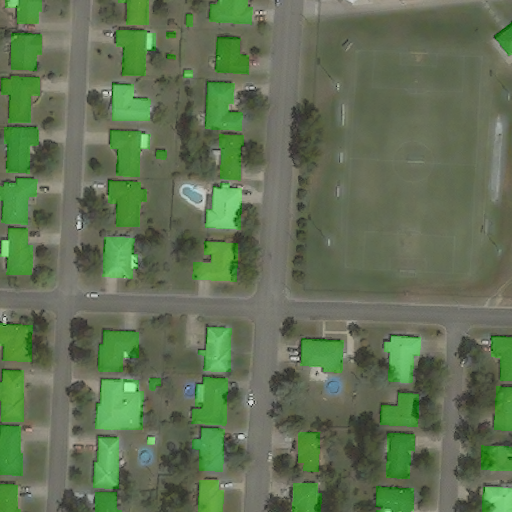

Ground truth


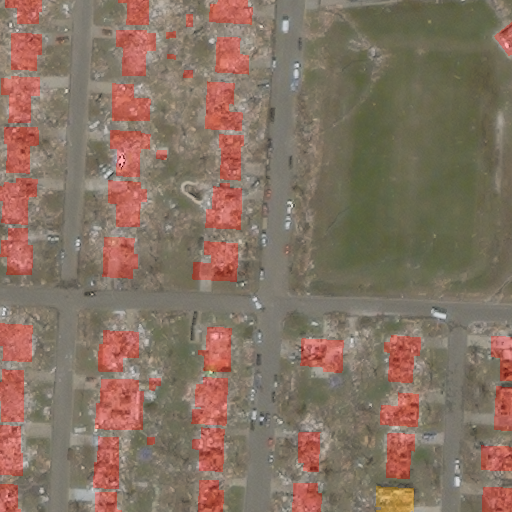

Preds


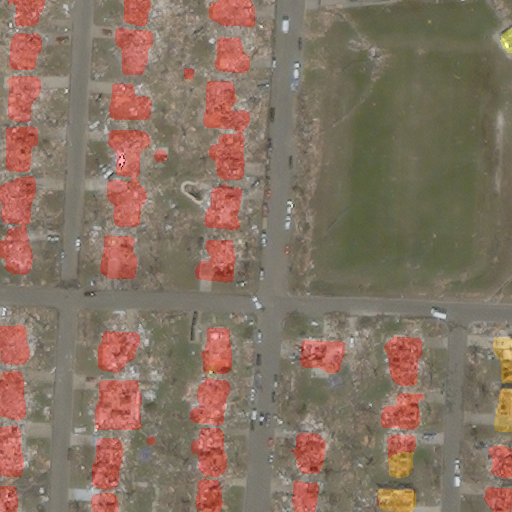

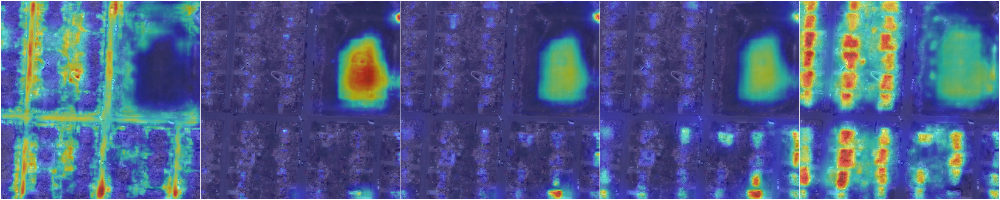

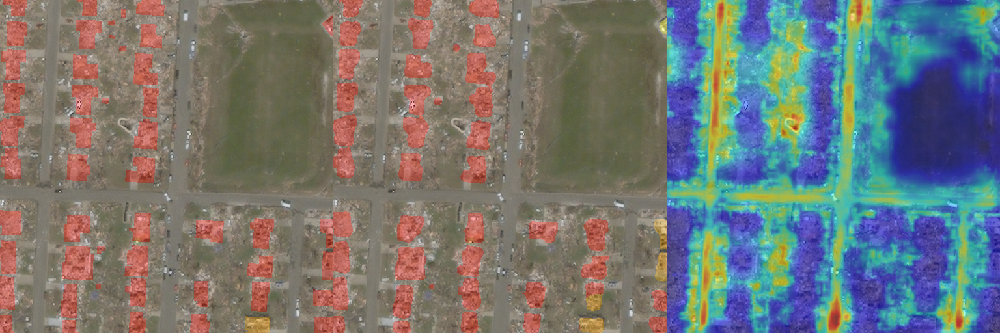

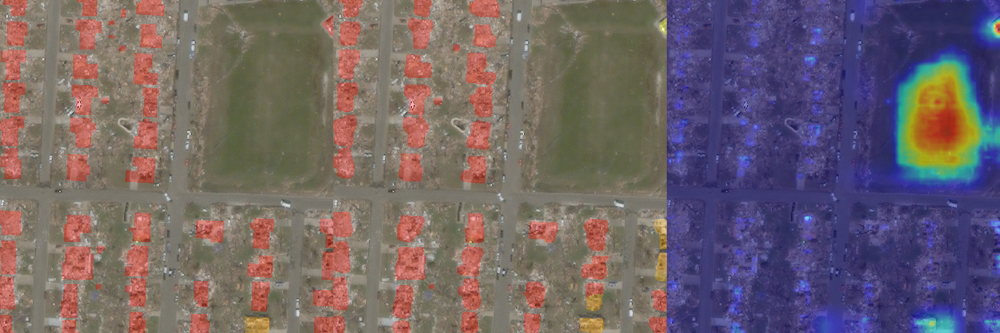

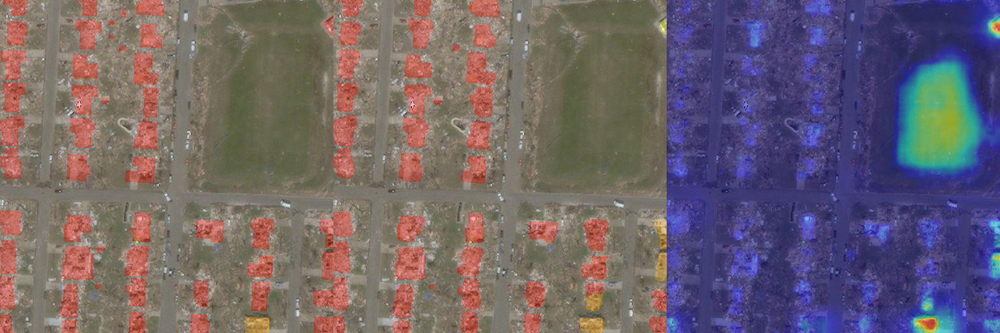

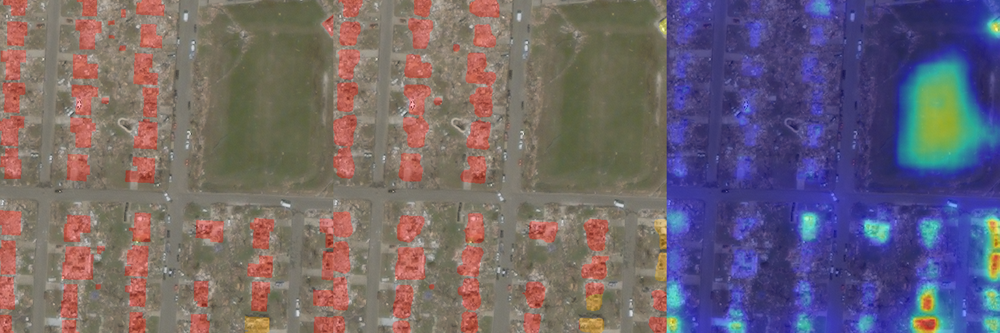

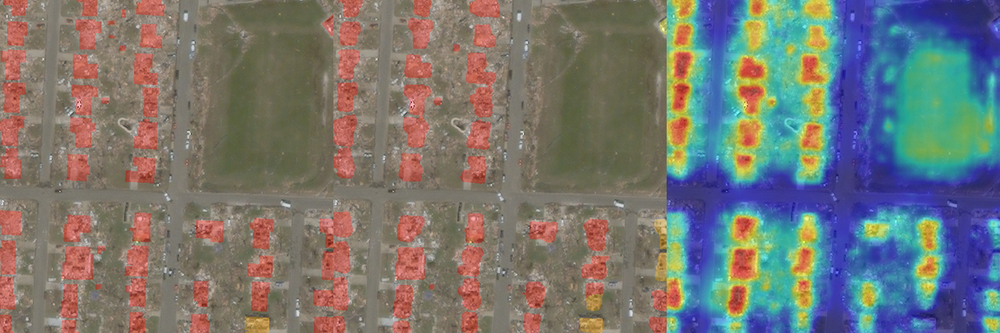

In [19]:
# region boring

from inz.models.baseline_module import BaselineModule
from inz.models.baseline_singlebranch import SingleBranchBaselinePLModule
from inz.models.dahitra_module import DahitraPLModule
from inz.models.farseg_module import DoubleBranchFarSegModule
from inz.models.farseg_singlebranch_module import SingleBranchFarSegModule
from inz.models.msl.msl_module_wrapper import BaseMSLModuleWrapper


filters = {"display_name": {"$regex": RUN_NAME}} | ({"name": RUN_ID} if RUN_ID else {})

runs = api.runs(path="tomasz-owienko-stud-warsaw-university-of-technology/inz", filters=filters)

assert len(runs) == 1, f"Len runs is {len(runs)}"
run = runs[0]
run_id = run.id
run_created_at = datetime.fromisoformat(run._attrs["createdAt"])
cfg = (
    json.loads(run.json_config)["hydra_cfg"]["value"]
    .replace("'", '"')
    .replace("True", "true")
    .replace("False", "false")
)
cfg = json.loads(cfg)

OUTPUTS_PATH = Path("outputs")
run_dirs = list((OUTPUTS_PATH / RUN_NAME).glob("*/"))
dates_dirs = {
    (
        datetime.fromisoformat(run_dir.resolve().stem)
        if "T" in run_dir.resolve().stem
        else datetime.strptime(run_dir.resolve().stem, r"%Y-%m-%d_%H-%M-%S")
    ).replace(tzinfo=ZoneInfo("Europe/Warsaw"))
    - run_created_at: run_dir
    for run_dir in run_dirs
}

CHECKPOINTS_PATH = min(dates_dirs.items(), key=lambda kv: abs(kv[0]))[1] / "checkpoints"

challenge_score_checkpoints = CHECKPOINTS_PATH.rglob("./*-challenge_score*.ckpt")
ckpt_paths_with_scores = []
for path in challenge_score_checkpoints:
    match = re.search(r".*-challenge_score_safe-(0.\d+)-.*", path.stem) or re.search(
        r".*-challenge_score_target=(0.\d+)-.*", path.stem
    )
    ckpt_paths_with_scores.append((float(match.group(1)), path))
CKPT_PATH = max(ckpt_paths_with_scores, key=lambda sp: sp[0])[1]

model_class_str = cfg["module"]["module"]["_target_"]
model_class_name = model_class_str.split(".")[-1]
module_path = ".".join(model_class_str.split(".")[:-1])
imported_module = importlib.import_module(module_path)
model_class = getattr(imported_module, model_class_name)
model_partial = hydra.utils.instantiate(cfg["module"]["module"])

msg = f"""
Run name: {RUN_NAME}
Run id: {RUN_ID}
Model: {model_class.__name__}
Checkpoint path: {CKPT_PATH}
"""
print(msg)

if "msl" in RUN_NAME:
    print("Wrapping in MSL")
    model_msl = BaseMSLModuleWrapper.load_from_checkpoint(
        CKPT_PATH, pl_module=model_partial(), msl_loss_module=None
    ).to(device)
    model = model_msl.inner
else:
    model = model_class.load_from_checkpoint(CKPT_PATH, *model_partial.args, **model_partial.keywords).to(device)

model.eval()


dm = XBDDataModule(
    path=Path("data/xBD_processed_512"),
    drop_unclassified_channel=True,
    split_events={
        "test": {
            Tier1: [
                Event.guatemala_volcano,
                Event.hurricane_florence,
                Event.hurricane_harvey,
                Event.hurricane_matthew,
                Event.hurricane_michael,
                Event.mexico_earthquake,
                Event.midwest_flooding,
                Event.palu_tsunami,
                Event.santa_rosa_wildfire,
                Event.socal_fire,
            ],
            Test: [
                Event.guatemala_volcano,
                Event.hurricane_florence,
                Event.hurricane_harvey,
                Event.hurricane_matthew,
                Event.hurricane_michael,
                Event.mexico_earthquake,
                Event.midwest_flooding,
                Event.palu_tsunami,
                Event.santa_rosa_wildfire,
                Event.socal_fire,
            ],
            Hold: [
                Event.guatemala_volcano,
                Event.hurricane_florence,
                Event.hurricane_harvey,
                Event.hurricane_matthew,
                Event.hurricane_michael,
                Event.mexico_earthquake,
                Event.midwest_flooding,
                Event.palu_tsunami,
                Event.santa_rosa_wildfire,
                Event.socal_fire,
            ],
            Tier3: [
                Event.joplin_tornado,
                Event.lower_puna_volcano,
                Event.moore_tornado,
                Event.nepal_flooding,
                Event.pinery_bushfire,
                Event.portugal_wildfire,
                Event.sunda_tsunami,
                Event.tuscaloosa_tornado,
                Event.woolsey_fire,
            ],
        }
    },
    train_batch_size=1,
    val_batch_size=1,
    test_batch_size=1,
)
dm.prepare_data()
dm.setup("test")


class SemanticSegmentationTarget:
    def __init__(self, category, mask):
        self.category = category
        self.mask = mask
        if torch.cuda.is_available():
            self.mask = self.mask.cuda()

    def __call__(self, model_output):
        return (model_output[self.category, :, :] * self.mask).sum()


IMG_PATH_POST = next(Path("data/xBD_processed_512/images").rglob(f"*/images/{IMG_NAME}.png"))


if isinstance(model, DoubleBranchFarSegModule) or isinstance(model, SingleBranchFarSegModule):
    # target_layers = model.model.module.decooder.blocks[:-3]
    # target_layers = model.model.module.sr.scene_encoder

    if FARSEG_GRADCAM_TARGET == "background":
        # ALLOWS TO PREVIEW BACKGROUND MASKS
        target_layers = model.model.module.sr.content_encoders
    else:
        target_layers = model.model.module.sr.feature_reencoders
elif isinstance(model, BaselineModule) or isinstance(model, SingleBranchBaselinePLModule):
    target_layers = [
        # model.model.conv3
        model.model.conv6_2,
        model.model.conv7_2,
        model.model.conv8_2,
        model.model.conv9_2,
        # model.model.conv10,
        # model.model.res,
    ]
    # target_layers = [
    #     model.model.conv1,
    #     model.model.conv2,
    #     model.model.conv3,
    # model.model.conv4,
    # model.model.conv5,
    # ]
elif isinstance(model, DahitraPLModule):
    target_layers = [
        model.model.module.conv_decode_5,
        model.model.module.conv_decode_4,
        model.model.module.conv_decode_3,
        model.model.module.conv_decode_5,
    ]

else:
    raise NotImplementedError(f"Gradcam not implemented for model {model_class.__name__}")

item = dm._test_dataset[dm._test_dataset._image_paths_post.index(IMG_PATH_POST)]
image_pre, mask_pre, image_post, mask_post = item

with torch.no_grad():
    m = model.to(device)
    preds = m(torch.cat([torch.unsqueeze(image_pre, 0), torch.unsqueeze(image_post, 0)], dim=1).to(device))

colors = [
    (128, 128, 128),
    (0, 255, 0),
    (244, 255, 0),
    (255, 174, 0),
    (255, 0, 0),
    (255, 255, 255),
]
preds_masks = draw_segmentation_masks(
    ((image_post + 1) * 127.5).to(torch.uint8),
    torch.nn.functional.one_hot(preds[0].argmax(dim=0), num_classes=5).moveaxis(-1, 0).to(bool),
    colors=colors,
    alpha=0.3,
)
ground_truth_masks = draw_segmentation_masks(
    ((image_post + 1) * 127.5).to(torch.uint8), mask_post.to(bool), colors=colors, alpha=0.3
)
pre_disaster_masks = draw_segmentation_masks(
    ((image_pre + 1) * 127.5).to(torch.uint8), mask_pre.to(bool), colors=colors, alpha=0.3
)

print("Pre-disaster")
display(Image.fromarray(pre_disaster_masks.moveaxis(0, -1).detach().cpu().numpy()))
print("Ground truth")
display(Image.fromarray(ground_truth_masks.moveaxis(0, -1).detach().cpu().numpy()))
print("Preds")
display(Image.fromarray(preds_masks.moveaxis(0, -1).detach().cpu().numpy()))

GRADCAM_CLASS = GradCAM
N_CLASSES = 5

acts = []
for c in range(0, N_CLASSES):
    targets = [SemanticSegmentationTarget(c, mask_post.argmax(axis=0))]
    with GRADCAM_CLASS(
        model=model,
        target_layers=target_layers,
    ) as cam:
        grayscale_cam = cam(input_tensor=torch.unsqueeze(torch.cat([image_pre, image_post], dim=0), 0), targets=targets)[
            0, :
        ]
        cam_image = show_cam_on_image(
            ((image_post + 1) / 2).moveaxis(0, -1).detach().cpu().numpy(), grayscale_cam, use_rgb=True
        )

    acts.append(torch.from_numpy(cam_image).moveaxis(-1, 0))
comp_acts = make_grid(torch.stack(acts), padding=2, pad_value=255)
display(Image.fromarray(comp_acts.moveaxis(0, -1).numpy()))


for c in range(0, N_CLASSES):
    targets = [SemanticSegmentationTarget(c, mask_post.argmax(axis=0))]
    with GRADCAM_CLASS(
        model=model,
        target_layers=target_layers,
    ) as cam:
        grayscale_cam = cam(
            input_tensor=torch.unsqueeze(torch.cat([image_pre, image_post], dim=0), 0), targets=targets
        )[0, :]
        cam_image = show_cam_on_image(
            ((image_post + 1) / 2).moveaxis(0, -1).detach().cpu().numpy(), grayscale_cam, use_rgb=True
        )

    comp = np.hstack(
        (
            ground_truth_masks.moveaxis(0, -1).detach().cpu().numpy(),
            preds_masks.moveaxis(0, -1).detach().cpu().numpy(),
            cam_image,
        )
    )
    display(Image.fromarray(comp))

# endregion